# Final Project DL Course
## Classification of Dog's Breed
###By: <br>
Group 1:<br>
Ofri Nussel, Tomer Blumental, Yael Keller
<br> Group 2: <br>
Netta Cohen, Asaf Sofer

As passionate dog lovers, we have chosen to focus our project on dogs!
In this project, we will classify pictures of dogs by their breed. We will employ image processing and manipulation techniques to achieve optimal results.
Our dataset originates from: https://www.kaggle.com/datasets/jessicali9530/stanford-dogs-dataset/data


At the beginning, we will explore the data and create visualizations. <br>Then, we will preprocess the data to prepare it as input for CNN models. <br>Finally, each group will implement a different model and present their results! <br>Let's begin :)

### Importing packages and loading the data

In [ ]:
from keras.datasets import mnist
import zipfile
import os
import shutil
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import pandas as pd
from IPython.display import Image, display
from PIL import ImageOps
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img
import tensorflow_hub as hub
from tensorflow.keras import layers
from keras.backend import clear_session
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
import xml.etree.ElementTree as ET
from PIL import Image
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
import seaborn as sns
from collections import Counter

Mounted at /content/drive


Loading the data to google drive

In [ ]:
zip_file_path = "/content/drive/MyDrive/Final_Project/dog_breeds.zip"

extracted_dir_path = "/content/dog_breeds/images/Images"

os.makedirs(extracted_dir_path, exist_ok=True) # Create the directory if it doesn't exist

# Extract the zip file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_dir_path)

# Let's see the content of the directory
print("Contents of the extracted directory:")
print(os.listdir(extracted_dir_path))

Contents of the extracted directory:
['annotations', 'images']


The image directory contains our data and the annotation directory contains the metadata- information about the images size, the location of the dog etc.

In [ ]:
extracted_dir_path+="/images/Images"

In [ ]:
print("Contents of the extracted directory:")
print(os.listdir(extracted_dir_path))

Contents of the extracted directory:
['n02085782-Japanese_spaniel', 'n02100583-vizsla', 'n02101556-clumber', 'n02085936-Maltese_dog', 'n02108551-Tibetan_mastiff', 'n02094258-Norwich_terrier', 'n02087046-toy_terrier', 'n02107142-Doberman', 'n02086240-Shih-Tzu', 'n02089973-English_foxhound', 'n02095570-Lakeland_terrier', 'n02107574-Greater_Swiss_Mountain_dog', 'n02111500-Great_Pyrenees', 'n02088466-bloodhound', 'n02091032-Italian_greyhound', 'n02099712-Labrador_retriever', 'n02086079-Pekinese', 'n02106550-Rottweiler', 'n02096294-Australian_terrier', 'n02098105-soft-coated_wheaten_terrier', 'n02112018-Pomeranian', 'n02105162-malinois', 'n02110627-affenpinscher', 'n02100735-English_setter', 'n02110806-basenji', 'n02094114-Norfolk_terrier', 'n02088094-Afghan_hound', 'n02098413-Lhasa', 'n02089867-Walker_hound', 'n02111277-Newfoundland', 'n02109047-Great_Dane', 'n02086910-papillon', 'n02106662-German_shepherd', 'n02088238-basset', 'n02093428-American_Staffordshire_terrier', 'n02097047-miniatu

Making sure we have 120 breeds and 20,580 images as it says in the Kaggle website:

In [ ]:
breed_list = os.listdir(extracted_dir_path)

num_classes = len(breed_list)
print("{} breeds".format(num_classes))

n_total_images = 0
for breed in breed_list:
    n_total_images += len(os.listdir(extracted_dir_path+"/{}".format(breed)))
print("{} images".format(n_total_images))

120 breeds
20580 images


In [ ]:
breed_list

['n02085782-Japanese_spaniel',
 'n02100583-vizsla',
 'n02101556-clumber',
 'n02085936-Maltese_dog',
 'n02108551-Tibetan_mastiff',
 'n02094258-Norwich_terrier',
 'n02087046-toy_terrier',
 'n02107142-Doberman',
 'n02086240-Shih-Tzu',
 'n02089973-English_foxhound',
 'n02095570-Lakeland_terrier',
 'n02107574-Greater_Swiss_Mountain_dog',
 'n02111500-Great_Pyrenees',
 'n02088466-bloodhound',
 'n02091032-Italian_greyhound',
 'n02099712-Labrador_retriever',
 'n02086079-Pekinese',
 'n02106550-Rottweiler',
 'n02096294-Australian_terrier',
 'n02098105-soft-coated_wheaten_terrier',
 'n02112018-Pomeranian',
 'n02105162-malinois',
 'n02110627-affenpinscher',
 'n02100735-English_setter',
 'n02110806-basenji',
 'n02094114-Norfolk_terrier',
 'n02088094-Afghan_hound',
 'n02098413-Lhasa',
 'n02089867-Walker_hound',
 'n02111277-Newfoundland',
 'n02109047-Great_Dane',
 'n02086910-papillon',
 'n02106662-German_shepherd',
 'n02088238-basset',
 'n02093428-American_Staffordshire_terrier',
 'n02097047-miniature

Let's make a clean breed list

In [ ]:
cleaned_breed_list = []

for breed in breed_list:
    # Split each breed by '-' and take the second part
    cleaned_breed = breed.split('-')[1]
    # Append the cleaned breed to the cleaned_breed_list
    cleaned_breed_list.append(cleaned_breed)

print(cleaned_breed_list)

['Japanese_spaniel', 'vizsla', 'clumber', 'Maltese_dog', 'Tibetan_mastiff', 'Norwich_terrier', 'toy_terrier', 'Doberman', 'Shih', 'English_foxhound', 'Lakeland_terrier', 'Greater_Swiss_Mountain_dog', 'Great_Pyrenees', 'bloodhound', 'Italian_greyhound', 'Labrador_retriever', 'Pekinese', 'Rottweiler', 'Australian_terrier', 'soft', 'Pomeranian', 'malinois', 'affenpinscher', 'English_setter', 'basenji', 'Norfolk_terrier', 'Afghan_hound', 'Lhasa', 'Walker_hound', 'Newfoundland', 'Great_Dane', 'papillon', 'German_shepherd', 'basset', 'American_Staffordshire_terrier', 'miniature_schnauzer', 'Boston_bull', 'black', 'Brittany_spaniel', 'Irish_water_spaniel', 'cocker_spaniel', 'bull_mastiff', 'EntleBucher', 'kelpie', 'borzoi', 'groenendael', 'Sealyham_terrier', 'kuvasz', 'dhole', 'Yorkshire_terrier', 'Shetland_sheepdog', 'Brabancon_griffon', 'Irish_terrier', 'Bouvier_des_Flandres', 'silky_terrier', 'German_short', 'pug', 'African_hunting_dog', 'Samoyed', 'Leonberg', 'Gordon_setter', 'English_spr

Showing some examples

n02085782-Japanese_spaniel


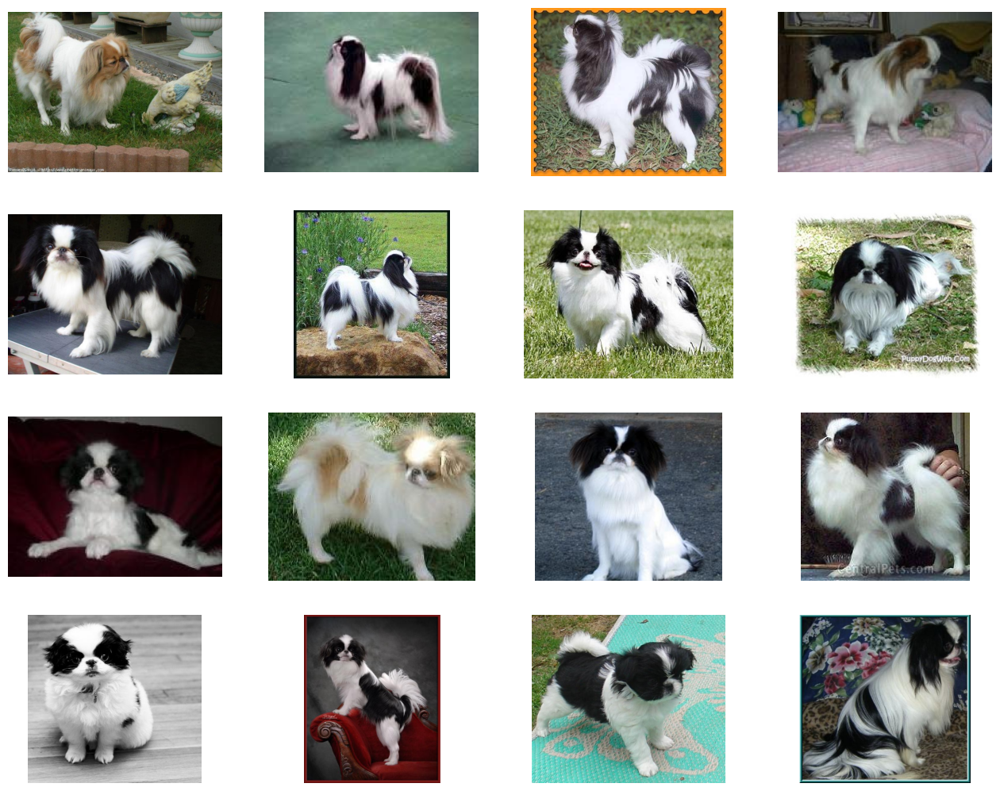

In [ ]:
def show_dir_images(breed, n_to_show):
    plt.figure(figsize=(16, 16))
    img_dir = extracted_dir_path + "/{}/".format(breed)
    images = os.listdir(img_dir)[:n_to_show]
    for i in range(n_to_show):
        img = mpimg.imread(img_dir + images[i])
        plt.subplot(n_to_show // 4 + 1, 4, i + 1)
        plt.imshow(img)
        plt.axis('off')

print(breed_list[0])
show_dir_images(breed_list[0], 16)


We can see that the images are not on the same size, and also includes noisy background, in order to make our model better, we will handle it on the preprocessing step.

### Exploration & Vizualiztion

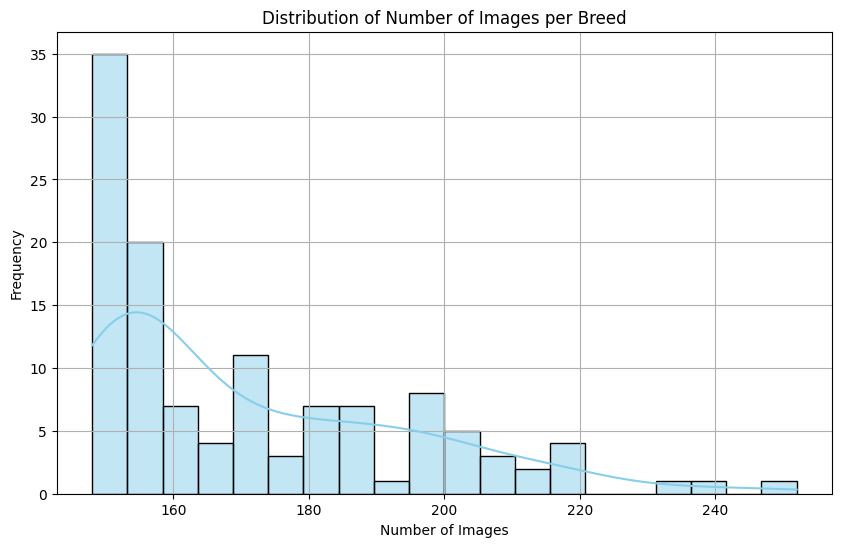

Basic Data Exploration:
Number of breeds: 120
Total number of images: 20580
Minimum number of images per breed: 148
Maximum number of images per breed: 252
Mean number of images per breed: 171.5
Median number of images per breed: 159.5
Standard deviation of number of images per breed: 23.123941417212308


In [ ]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Get the list of breed directories
breed_list = os.listdir(extracted_dir_path)

# Filter out hidden files/folders and non-directory files
breed_list = [breed for breed in breed_list if not breed.startswith('.') and os.path.isdir(os.path.join(extracted_dir_path, breed))]

# Initialize lists to store breed names and image counts
breed_names = []
image_counts = []

# Iterate through each breed directory
for breed in breed_list:
    # Construct the full path to the current breed directory
    breed_dir_path = os.path.join(extracted_dir_path, breed)
    # Count the number of images in the current breed directory
    n_images = len(os.listdir(breed_dir_path))

    # Append breed name and image count to lists
    breed_names.append(breed)
    image_counts.append(n_images)

# Plot distribution of number of images per breed
plt.figure(figsize=(10, 6))
sns.histplot(image_counts, bins=20, kde=True, color='skyblue')
plt.xlabel('Number of Images')
plt.ylabel('Frequency')
plt.title('Distribution of Number of Images per Breed')
plt.grid(True)
plt.show()

# Basic data exploration
print("Basic Data Exploration:")
print("Number of breeds:", len(breed_list))
print("Total number of images:", np.sum(image_counts))
print("Minimum number of images per breed:", np.min(image_counts))
print("Maximum number of images per breed:", np.max(image_counts))
print("Mean number of images per breed:", np.mean(image_counts))
print("Median number of images per breed:", np.median(image_counts))
print("Standard deviation of number of images per breed:", np.std(image_counts))


In [ ]:
# Function to count the number of pictures in a directory
def count_pictures(directory_path):
    picture_count = 0
    for filename in os.listdir(directory_path):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.gif', '.bmp')):
            picture_count += 1
    return picture_count

# Dictionary to store the counts for each directory
picture_counts = {}

# Iterate over each directory in extracted_dir_path
for directory in os.listdir(extracted_dir_path):
    directory_path = os.path.join(extracted_dir_path, directory)
    if os.path.isdir(directory_path):
        picture_counts[directory] = count_pictures(directory_path)

# Print the counts for each directory
for directory, count in picture_counts.items():
    print(f"Directory: {directory}, Picture count: {count}")


Directory: n02085782-Japanese_spaniel, Picture count: 185
Directory: n02100583-vizsla, Picture count: 154
Directory: n02101556-clumber, Picture count: 150
Directory: n02085936-Maltese_dog, Picture count: 252
Directory: n02108551-Tibetan_mastiff, Picture count: 152
Directory: n02094258-Norwich_terrier, Picture count: 185
Directory: n02087046-toy_terrier, Picture count: 172
Directory: n02107142-Doberman, Picture count: 150
Directory: n02086240-Shih-Tzu, Picture count: 214
Directory: n02089973-English_foxhound, Picture count: 157
Directory: n02095570-Lakeland_terrier, Picture count: 197
Directory: n02107574-Greater_Swiss_Mountain_dog, Picture count: 168
Directory: n02111500-Great_Pyrenees, Picture count: 213
Directory: n02088466-bloodhound, Picture count: 187
Directory: n02091032-Italian_greyhound, Picture count: 182
Directory: n02099712-Labrador_retriever, Picture count: 171
Directory: n02086079-Pekinese, Picture count: 149
Directory: n02106550-Rottweiler, Picture count: 152
Directory: n

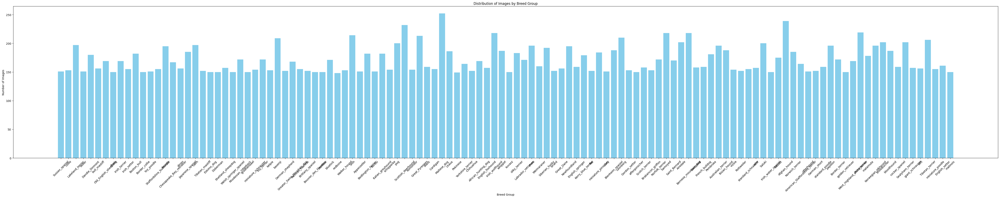

In [ ]:
# Bar plot of image counts by breed group (if applicable)
breed_groups = set([breed.split('-')[0] for breed in cleaned_breed_list])
group_counts = {group: sum(image_counts[i] for i in range(len(cleaned_breed_list)) if cleaned_breed_list[i].startswith(group)) for group in breed_groups}
plt.figure(figsize=(50, 10))
plt.bar(group_counts.keys(), group_counts.values(), color='skyblue')
plt.xlabel('Breed Group')
plt.ylabel('Number of Images')
plt.title('Distribution of Images by Breed Group')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Taking a look at the 10 breeds with the most photos and then the 10 breeds with the least photos

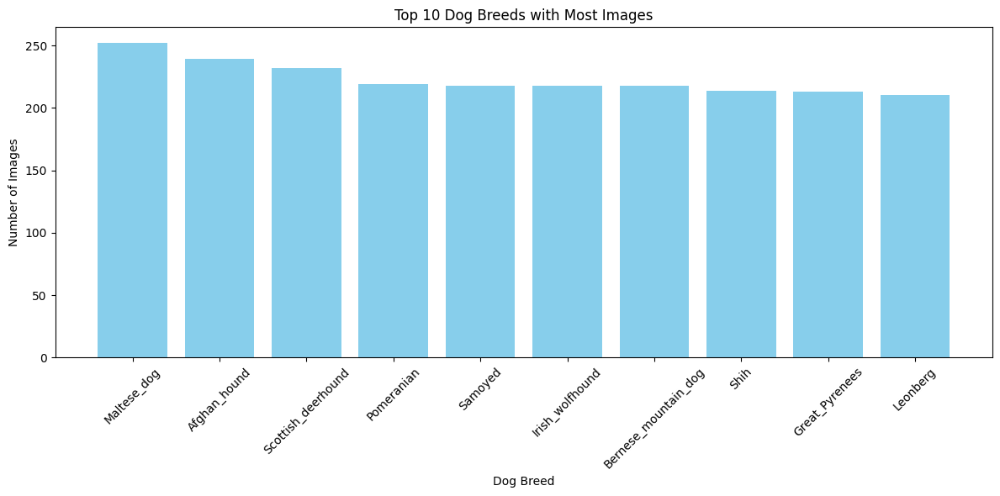

In [ ]:
# Top 10 breeds with most images
N = 10
sorted_indices = sorted(range(len(image_counts)), key=lambda i: image_counts[i], reverse=True)[:N]
top_breeds = [cleaned_breed_list[i] for i in sorted_indices]
top_counts = [image_counts[i] for i in sorted_indices]
plt.figure(figsize=(12, 6))
plt.bar(top_breeds, top_counts, color='skyblue')
plt.xlabel('Dog Breed')
plt.ylabel('Number of Images')
plt.title(f'Top {N} Dog Breeds with Most Images')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


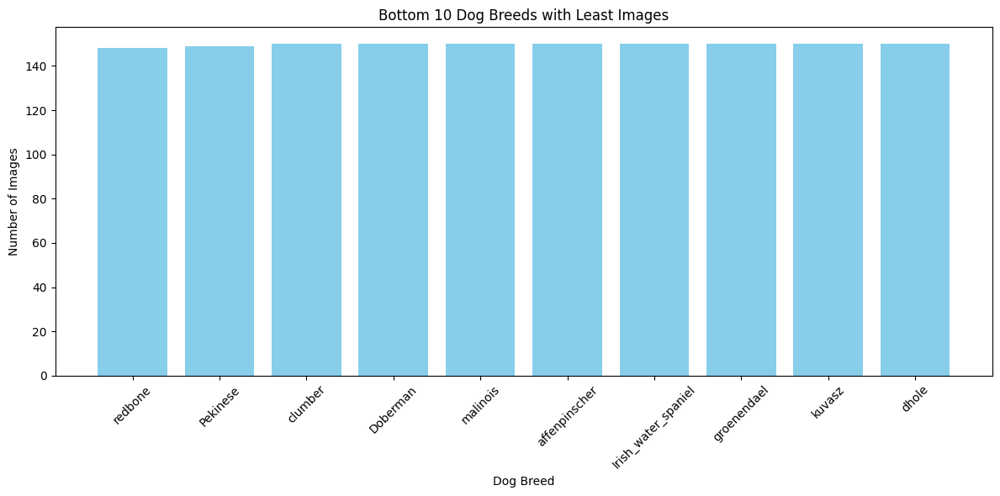

In [ ]:
# Bottom N breeds with least images
bottom_indices = sorted(range(len(image_counts)), key=lambda i: image_counts[i])[:N]
bottom_breeds = [cleaned_breed_list[i] for i in bottom_indices]
bottom_counts = [image_counts[i] for i in bottom_indices]
plt.figure(figsize=(12, 6))
plt.bar(bottom_breeds, bottom_counts, color='skyblue')
plt.xlabel('Dog Breed')
plt.ylabel('Number of Images')
plt.title(f'Bottom {N} Dog Breeds with Least Images')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Taking a look at the annotation files, seems like we can use them to grasp the sizes of every image and to crop the images.

Here's how an annotation file looks like

	<folder>02085782</folder>
	<filename>n02085782_17</filename>
	<source>
		<database>ImageNet database</database>
	</source>
	<size>
		<width>393</width>
		<height>425</height>
		<depth>3</depth>
	</size>
	<segment>0</segment>
	<object>
		<name>Japanese_spaniel</name>
		<pose>Unspecified</pose>
		<truncated>0</truncated>
		<difficult>0</difficult>
		<bndbox>
			<xmin>48</xmin>
			<ymin>102</ymin>
			<xmax>367</xmax>
			<ymax>367</ymax>
		</bndbox>
	</object>

Plotting the dimensions of the images:

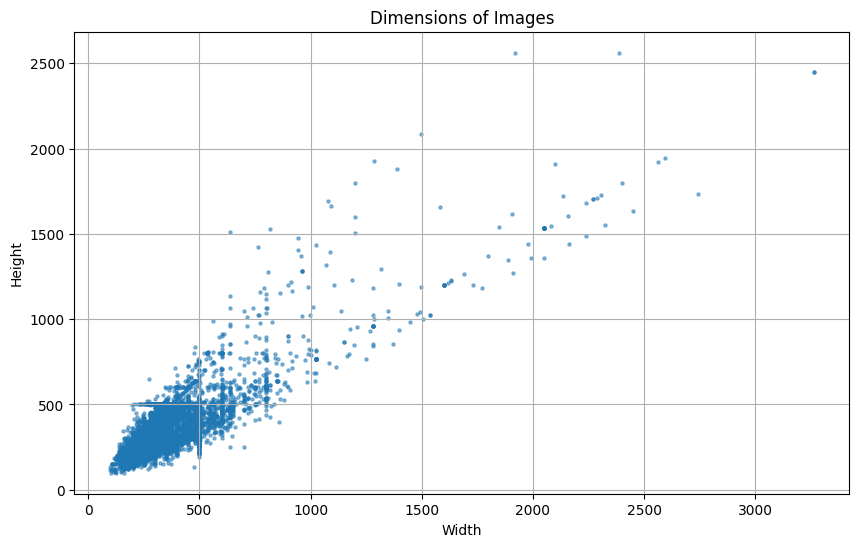

In [ ]:
import os
import matplotlib.pyplot as plt

def get_image_dimensions(image_path):

    img = mpimg.imread(image_path)
    height, width, _ = img.shape
    return height, width

def extract_image_paths(extracted_dir_path, breed):

    img_dir = os.path.join(extracted_dir_path, breed)
    images = os.listdir(img_dir)
    image_paths = [os.path.join(img_dir, img) for img in images]
    return image_paths

# Initialize lists to store dimensions
all_widths = []
all_heights = []

# Iterate through each breed
for breed in breed_list:
    # Extract image paths for the breed
    image_paths = extract_image_paths(extracted_dir_path, breed)
    # Iterate through each image path
    for image_path in image_paths:
        # Get image dimensions
        height, width = get_image_dimensions(image_path)
        all_widths.append(width)
        all_heights.append(height)

# Plot dimensions
plt.figure(figsize=(10, 6))
plt.scatter(all_widths, all_heights, s=5, alpha=0.5)
plt.xlabel('Width')
plt.ylabel('Height')
plt.title('Dimensions of Images')
plt.grid(True)
plt.show()


We can see that the pictures are not in the same size; most of them are in similar sizes, but there are outliers as well. We will need to make all of them the same size in order to use CNN models.

Finding the 3 biggest images by dimensions

Top 1 Largest Image: /content/dog_breeds/images/Images/images/Images/n02093647-Bedlington_terrier/n02093647_2743.jpg, Height=2448, Width=3264


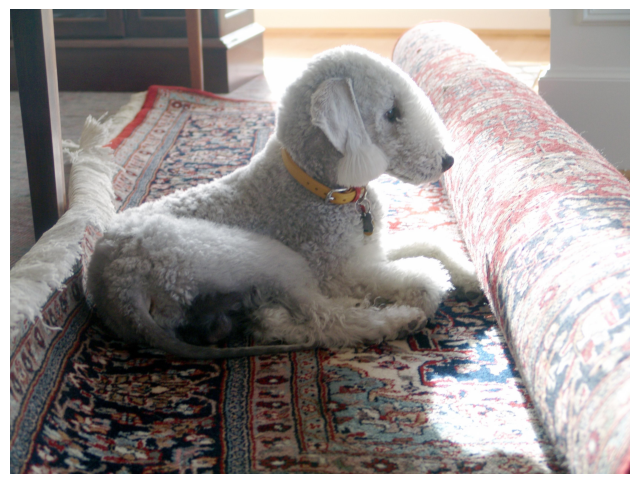

Top 2 Largest Image: /content/dog_breeds/images/Images/images/Images/n02085620-Chihuahua/n02085620_4602.jpg, Height=2448, Width=3264


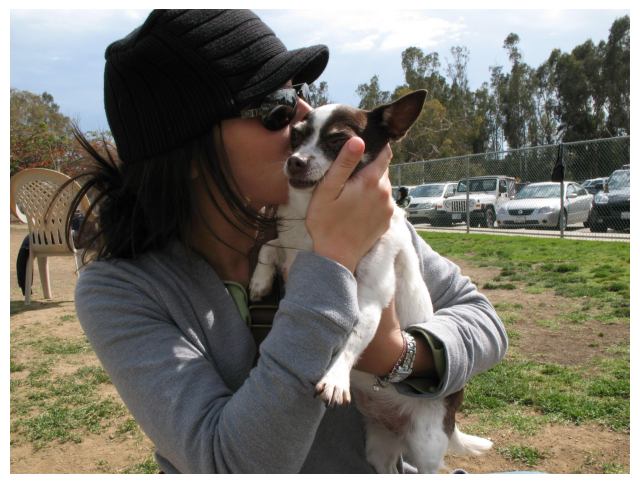

Top 3 Largest Image: /content/dog_breeds/images/Images/images/Images/n02089973-English_foxhound/n02089973_3037.jpg, Height=2562, Width=2388


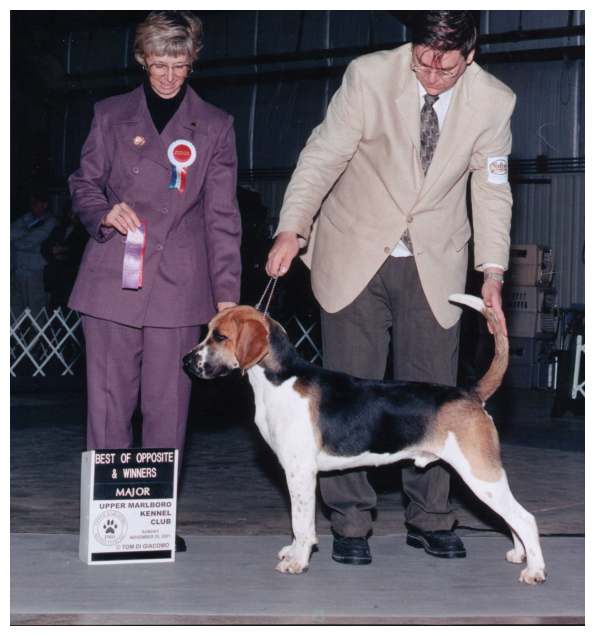

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import heapq


def find_largest_images(extracted_dir_path, n=3):

    largest_images = []

    def update_largest_images(image_path):
        nonlocal largest_images
        height, width = get_image_dimensions(image_path)
        area = height * width
        if len(largest_images) < n:
            heapq.heappush(largest_images, (area, image_path))
        else:
            heapq.heappushpop(largest_images, (area, image_path))

    for root, dirs, files in os.walk(extracted_dir_path):
        for file in files:
            image_path = os.path.join(root, file)
            update_largest_images(image_path)

    return [(image_path, *get_image_dimensions(image_path)) for _, image_path in sorted(largest_images, reverse=True)]

# Example usage
largest_images = find_largest_images(extracted_dir_path, n=3)
for i, (image_path, height, width) in enumerate(largest_images):
    print(f"Top {i+1} Largest Image: {image_path}, Height={height}, Width={width}")

    # Display the largest image
    largest_img = mpimg.imread(image_path)
    plt.figure(figsize=(8, 8))
    plt.imshow(largest_img)
    plt.axis('off')
    plt.show()


### Preprocessing

Cropping the dogs from the images using the data from the annotation

In [ ]:

def crop_image(breed, dog, data_dir):
  img = plt.imread(data_dir + 'images/Images/' + breed + '/' + dog + '.jpg')
  tree = ET.parse(data_dir + 'annotations/Annotation/' + breed + '/' + dog)
  xmin = int(tree.getroot().findall('object')[0].find('bndbox').find('xmin').text)
  xmax = int(tree.getroot().findall('object')[0].find('bndbox').find('xmax').text)
  ymin = int(tree.getroot().findall('object')[0].find('bndbox').find('ymin').text)
  ymax = int(tree.getroot().findall('object')[0].find('bndbox').find('ymax').text)
  img = img[ymin:ymax, xmin:xmax, :]
  return img

Showing some examples of how crop_image function works

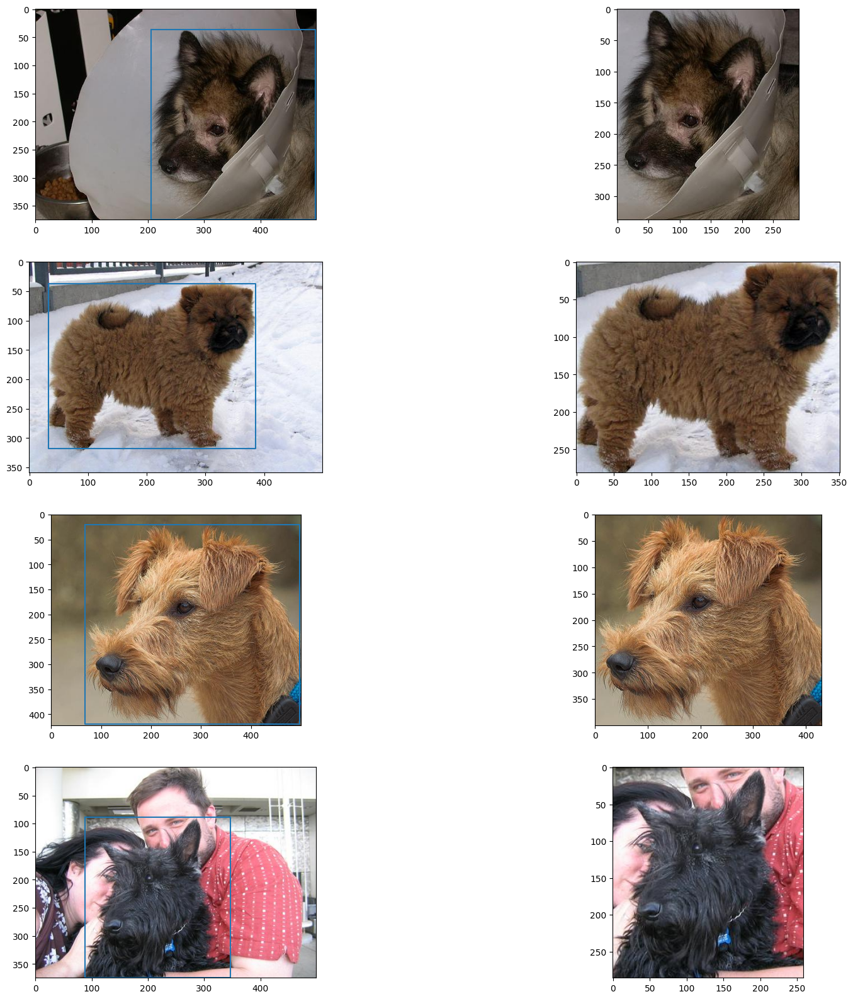

In [ ]:
data_dir='/content/dog_breeds/images/Images/'

breed_list = os.listdir(data_dir + 'images/Images/')

plt.figure(figsize=(20, 20))
for i in range(4):
  plt.subplot(421 + (i*2))
  breed = np.random.choice(breed_list)
  dog = np.random.choice(os.listdir(data_dir + 'annotations/Annotation/' + breed))
  img = plt.imread(data_dir + 'images/Images/' + breed + '/' + dog + '.jpg')
  plt.imshow(img)
  # mark the boundries of the dog before the cropping
  tree = ET.parse(data_dir + 'annotations/Annotation/' + breed + '/' + dog)
  xmin = int(tree.getroot().findall('object')[0].find('bndbox').find('xmin').text)
  xmax = int(tree.getroot().findall('object')[0].find('bndbox').find('xmax').text)
  ymin = int(tree.getroot().findall('object')[0].find('bndbox').find('ymin').text)
  ymax = int(tree.getroot().findall('object')[0].find('bndbox').find('ymax').text)
  plt.plot([xmin, xmax, xmax, xmin, xmin], [ymin, ymin, ymax, ymax, ymin])
  crop_img = crop_image(breed, dog, data_dir)
  plt.subplot(422 + (i*2))
  plt.imshow(crop_img)

Creating new folder-'data' for the cropped images and cropping them




In [ ]:
# Define the path to the data directory in Google Drive
new_data_dir_path = '/content/drive/My Drive/Final_Project/data'

flag = False # creating a flag in order to mark if this process happend already

# Check if the data directory exists, if not, create it
if 'data' not in os.listdir('/content/drive/My Drive/Final_Project'):
    flag = True
    os.mkdir(new_data_dir_path)

# Create directories for each breed
    for breed in breed_list:
       breed_dir_path = os.path.join(new_data_dir_path, breed)
       os.mkdir(breed_dir_path)

# Print the count of directories in the 'Final_Project/data' directory
    print('Created {} folders to store cropped images of the different breeds.'.format(len(os.listdir(new_data_dir_path))))
    for breed in os.listdir(new_data_dir_path):
      for file in os.listdir(data_dir + 'annotations/Annotation/' + breed):
          img = Image.open(data_dir + 'images/Images/' + breed + '/' + file + '.jpg')
          tree = ET.parse(data_dir + 'annotations/Annotation/' + breed + '/' + file)
          xmin = int(tree.getroot().findall('object')[0].find('bndbox').find('xmin').text)
          xmax = int(tree.getroot().findall('object')[0].find('bndbox').find('xmax').text)
          ymin = int(tree.getroot().findall('object')[0].find('bndbox').find('ymin').text)
          ymax = int(tree.getroot().findall('object')[0].find('bndbox').find('ymax').text)
          img = img.crop((xmin,ymin,xmax,ymax))
          img = img.convert('RGB')
          img.save(new_data_dir_path+'/' + breed + '/' + file + '.jpg')
else:
  print ('already exists')


already exists


Making sure that all the images have been cropped

In [ ]:
img_count = 0
for folder in os.listdir(new_data_dir_path):
    for _ in os.listdir(new_data_dir_path+'/' + folder):
        img_count += 1
print('No. of Images: {}'.format(img_count))

No. of Images: 20580


### Split X,Y

In [ ]:
def extract_labels_and_image_paths(dataset_dir):
    labels = []
    image_paths = []

    # Iterate over directories in the dataset
    for label_dir in os.listdir(dataset_dir):
        label_path = os.path.join(dataset_dir, label_dir)

        # Ensure it's a directory
        if os.path.isdir(label_path):
            # Split label directory name by '-' and check if it produces at least two parts
            parts = label_dir.split('-')
            if len(parts) >= 2:
                # Extract label from the second part
                label = parts[1].lower()
                labels.extend([label] * len(os.listdir(label_path)))

                # Iterate over images in the label directory
                for image_filename in os.listdir(label_path):
                    image_path = os.path.join(label_path, image_filename)
                    image_paths.append(image_path)

    return labels, image_paths


# Extract labels and image paths
Y, X = extract_labels_and_image_paths(new_data_dir_path)

# Print the first few labels and image paths
print("Labels:", Y[:5])
print("Image paths:", X[:5])

Labels: ['flat', 'flat', 'flat', 'flat', 'flat']
Image paths: ['/content/drive/My Drive/Final_Project/data/n02099267-flat-coated_retriever/n02099267_5306.jpg', '/content/drive/My Drive/Final_Project/data/n02099267-flat-coated_retriever/n02099267_5352.jpg', '/content/drive/My Drive/Final_Project/data/n02099267-flat-coated_retriever/n02099267_3768.jpg', '/content/drive/My Drive/Final_Project/data/n02099267-flat-coated_retriever/n02099267_1358.jpg', '/content/drive/My Drive/Final_Project/data/n02099267-flat-coated_retriever/n02099267_487.jpg']


In [ ]:
# Double check that the X and Y are in the same length
print(len(Y))
print(len(X))

20580
20580


In [ ]:
def show_image(breed, image_path):
    # Load and display the image
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.axis('off')
    plt.title(breed)
    plt.show()

Let's see a sample

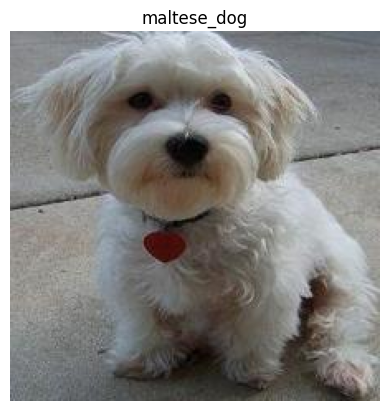

In [ ]:
show_image(Y[837], X[837])

#### One Hot Encoding to the labels

Our labels are categories (string) so we need to convert them to numerical, <br>
We have chosen to use 'One Hot Encoding' method to do so.

In [ ]:
def one_hot_encode_labels(labels):
    # Reshape the labels array to ensure it has the correct shape for fitting into the OneHotEncoder
    labels_reshaped = np.array(labels).reshape(-1, 1)

    # Initialize the OneHotEncoder
    encoder = OneHotEncoder(sparse=False)

    # Fit the OneHotEncoder to the labels and transform them into one-hot encoded vectors
    labels_encoded = encoder.fit_transform(labels_reshaped)

    return labels_encoded, encoder

Now, we will encode the labels to check if it's working

In [ ]:
labels_encoded, encoder = one_hot_encode_labels(Y)

print("Original labels:", Y)
print("One-hot encoded labels:")
print(labels_encoded)

Original labels: ['flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat'

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Creating a map for the labels to preserve the order of the breeds (we will use it in the model section)

In [ ]:
categories = encoder.categories_[0]

In [ ]:
categories

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog', 'black',
       'blenheim_spaniel', 'bloodhound', 'bluetick', 'border_collie',
       'border_terrier', 'borzoi', 'boston_bull', 'bouvier_des_flandres',
       'boxer', 'brabancon_griffon', 'briard', 'brittany_spaniel',
       'bull_mastiff', 'cairn', 'cardigan', 'chesapeake_bay_retriever',
       'chihuahua', 'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly', 'dandie_dinmont', 'dhole', 'dingo', 'doberman',
       'english_foxhound', 'english_setter', 'english_springer',
       'entlebucher', 'eskimo_dog', 'flat', 'french_bulldog',
       'german_shepherd', 'german_short', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
       'great_pyrenees', 'greater_swiss_mountain_dog', 'groenendael',
       'ibizan_ho

In [ ]:
label_maps = {}
label_maps_rev = {}
for i, v in enumerate(categories):
    label_maps.update({v: i})
    label_maps_rev.update({i : v})

In [ ]:
label_maps

{'affenpinscher': 0,
 'afghan_hound': 1,
 'african_hunting_dog': 2,
 'airedale': 3,
 'american_staffordshire_terrier': 4,
 'appenzeller': 5,
 'australian_terrier': 6,
 'basenji': 7,
 'basset': 8,
 'beagle': 9,
 'bedlington_terrier': 10,
 'bernese_mountain_dog': 11,
 'black': 12,
 'blenheim_spaniel': 13,
 'bloodhound': 14,
 'bluetick': 15,
 'border_collie': 16,
 'border_terrier': 17,
 'borzoi': 18,
 'boston_bull': 19,
 'bouvier_des_flandres': 20,
 'boxer': 21,
 'brabancon_griffon': 22,
 'briard': 23,
 'brittany_spaniel': 24,
 'bull_mastiff': 25,
 'cairn': 26,
 'cardigan': 27,
 'chesapeake_bay_retriever': 28,
 'chihuahua': 29,
 'chow': 30,
 'clumber': 31,
 'cocker_spaniel': 32,
 'collie': 33,
 'curly': 34,
 'dandie_dinmont': 35,
 'dhole': 36,
 'dingo': 37,
 'doberman': 38,
 'english_foxhound': 39,
 'english_setter': 40,
 'english_springer': 41,
 'entlebucher': 42,
 'eskimo_dog': 43,
 'flat': 44,
 'french_bulldog': 45,
 'german_shepherd': 46,
 'german_short': 47,
 'giant_schnauzer': 48,
 

In [ ]:
def get_key_from_value(my_dict, value):
    for key, val in my_dict.items():
        if val == value:
            return key
    # If value is not found, return None or raise an exception
    return None  # or raise ValueError("Value not found")


In [ ]:
get_key_from_value(label_maps, 115)

'welsh_springer_spaniel'

Senity check to make sure that the 'one hot encoding' function worked

In [ ]:
def decode_one_hot_encoded_labels(encoded_labels, encoder):
    # Inverse transform the one-hot encoded labels to get the original representation
    labels_decoded = encoder.inverse_transform(encoded_labels)
    # Extract the breed names from the transformed labels
    breed_names = [label[0] for label in labels_decoded]
    return breed_names


breed_names = decode_one_hot_encoded_labels(labels_encoded, encoder)

print("Breed names:")
print(breed_names)

Breed names:
['flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'flat', 'f

#### Split to train, validation and test

In [ ]:
# Split data into train and rest (rest will be splitted again)
x_train, x_rest, y_train, y_rest = train_test_split(X, Y, test_size=0.2, random_state=42)

# Split rest data into validation and test
x_val, x_test, y_val, y_test = train_test_split(x_rest, y_rest, test_size=0.5, random_state=42)

if 'split_data' not in os.listdir('/content/drive/My Drive/Final_Project'): # make sure this process won't happen repeatedly

    # Define the base directory where the new folders will be created
    base_dir = '/content/drive/My Drive/Final_Project/split_data'
    os.makedirs(base_dir, exist_ok=True)

    # Define the subdirectories for training, validation, and test data
    train_dir = os.path.join(base_dir, 'train')
    val_dir = os.path.join(base_dir, 'val')
    test_dir = os.path.join(base_dir, 'test')
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)

    # Copy images to the training directory
    for x_path, y_label in zip(x_train, y_train):
        label_dir = os.path.join(train_dir, str(y_label))
        os.makedirs(label_dir, exist_ok=True)
        shutil.copy(x_path, label_dir)

    # Copy images to the validation directory
    for x_path, y_label in zip(x_val, y_val):
        label_dir = os.path.join(val_dir, str(y_label))
        os.makedirs(label_dir, exist_ok=True)
        shutil.copy(x_path, label_dir)

    # Copy images to the test directory
    for x_path, y_label in zip(x_test, y_test):
        label_dir = os.path.join(test_dir, str(y_label))
        os.makedirs(label_dir, exist_ok=True)
        shutil.copy(x_path, label_dir)
else:
    print('already exists')


already exists


#### Implementing the one hot encoding on each group


In [ ]:
y_train_encoded, encoder = one_hot_encode_labels(y_train)
y_val_encoded, encoder = one_hot_encode_labels(y_val)
y_test_encoded, encoder = one_hot_encode_labels(y_test)


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(








### Model Group 1- mobilenet_v2_130_224


MobileNetV2_130_224, a variation of the MobileNetV2 architecture, is specifically designed for image classification tasks with a resolution of 224x224 pixels. It effectively balances computational efficiency with model accuracy. Additionally, its pretrained weights on datasets such as ImageNet greatly facilitate efficient transfer learning.

Our labels are in numeric format but our images are still just file paths. We are going to use TensorFlow so we need to change the type of our data to be in the form of Tensors.





In [ ]:
# Function to create a dataset from image paths and labels
def create_dataset(image_paths, labels, img_height, img_width, batch_size):
    # Create a TensorFlow dataset from image paths and labels
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, labels))

    # Define a function to load and preprocess images
    def load_and_preprocess_image(path, label):
        # Read image from file
        image = tf.io.read_file(path)
        # Decode image and resize to desired dimensions
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, [img_height, img_width])
        # Normalize pixel values
        image = image / 255.0
        return image, label

    # Apply the load_and_preprocess_image function to each image path and label
    dataset = dataset.map(load_and_preprocess_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)

    # Shuffle and batch the dataset
    dataset = dataset.shuffle(buffer_size=1000).batch(batch_size)

    return dataset

# Define image dimensions and batch size
IMG_HEIGHT = 224 #This is the size the suitable for the model
IMG_WIDTH = 224
BATCH_SIZE = 32

# Create TensorFlow datasets for training, validation, and testing
train_dataset_tf = create_dataset(x_train, y_train_encoded, IMG_HEIGHT, IMG_WIDTH, BATCH_SIZE)
val_dataset_tf = create_dataset(x_val, y_val_encoded, IMG_HEIGHT, IMG_WIDTH, BATCH_SIZE)
test_dataset_tf = create_dataset(x_test, y_test_encoded, IMG_HEIGHT, IMG_WIDTH, BATCH_SIZE)


In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_HEIGHT, IMG_WIDTH, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = 120 # number of unique labels

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"


In [ ]:

# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # Telling our model how to improve its guesses
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model


In [ ]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


The final parameter we'll define before training is NUM_EPOCHS (also known as number of epochs).

NUM_EPOCHS defines how many passes of the data we'd like our model to do. A pass is equivalent to our model trying to find patterns in each dog image and see which patterns relate to each label.



In [ ]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 10


In [ ]:
# Build a function to train and return a trained model
def train_model(train, val):
  #Trains a given model and returns the trained version.
  model.fit(x=train,
            epochs=NUM_EPOCHS,
            validation_data=val,
            validation_freq=1, # check validation metrics every epoch
            )

  return model

In [ ]:
# Fit the model to the data
model = train_model(train_dataset_tf, val_dataset_tf)

Epoch 1/10
515/515 [==============================] - 3714s 7s/step - loss: 0.9526 - accuracy: 0.7522 - val_loss: 0.5664 - val_accuracy: 0.8251
Epoch 2/10
515/515 [==============================] - 976s 2s/step - loss: 0.3533 - accuracy: 0.8888 - val_loss: 0.5723 - val_accuracy: 0.8372
Epoch 3/10
515/515 [==============================] - 900s 2s/step - loss: 0.2386 - accuracy: 0.9276 - val_loss: 0.5961 - val_accuracy: 0.8222
Epoch 4/10
515/515 [==============================] - 900s 2s/step - loss: 0.1708 - accuracy: 0.9519 - val_loss: 0.6066 - val_accuracy: 0.8319
Epoch 5/10
515/515 [==============================] - 898s 2s/step - loss: 0.1262 - accuracy: 0.9665 - val_loss: 0.6267 - val_accuracy: 0.8280
Epoch 6/10
515/515 [==============================] - 895s 2s/step - loss: 0.0971 - accuracy: 0.9748 - val_loss: 0.6644 - val_accuracy: 0.8260
Epoch 7/10
515/515 [==============================] - 898s 2s/step - loss: 0.0760 - accuracy: 0.9820 - val_loss: 0.6947 - val_accuracy: 0.828

#### Results

In [ ]:


def plot_images_with_predictions(x, y_true, label_map, model, num_images_to_plot=9):
    """
    Plots images from the validation set along with model predictions.
    """
    # Define image dimensions
    IMG_HEIGHT = 224
    IMG_WIDTH = 224

    # Load and preprocess the first few images
    plt.figure(figsize=(10, 10))
    for i in range(num_images_to_plot):
        # Read image from file
        image = tf.io.read_file(x[i])
        # Decode image and resize to desired dimensions
        image = tf.image.decode_jpeg(image, channels=3)
        image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH])
        # Normalize pixel values
        image = image / 255.0

        # Predict using the model
        prediction = model.predict(tf.expand_dims(image, axis=0))

        # Get the predicted class index
        predicted_class_index = np.argmax(prediction)

        # Get the predicted class label
        predicted_class_label = get_key_from_value(label_maps, predicted_class_index)

        # Get the true class label
        true_class_label = y_true[i]

        # Plot the image along with prediction and true label
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(image.numpy())  # Plot the ith image
        plt.title(f"Predicted: {predicted_class_label}\nTrue: {true_class_label}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


To input only the x_test into the model, we preprocessed the x_test data separately to Tensor format.

In [ ]:
# Function to preprocess an image
def preprocess_image(image_path, img_height=224, img_width=224):
    # Read image from file
    image = tf.io.read_file(image_path)
    # Decode image and resize to desired dimensions
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [img_height, img_width])
    # Normalize pixel values
    image = image / 255.0
    return image

# Preprocess images in X_test
X_test_processed = [preprocess_image(image_path) for image_path in x_test]

# Convert list of processed images to a TensorFlow dataset
test_dataset_tf = tf.data.Dataset.from_tensor_slices(X_test_processed).batch(8)

# Predict on the test dataset
predictions = model.predict(test_dataset_tf)

# Now 'predictions' contains the predicted outputs for the test dataset


258/258 [==============================] - 75s 280ms/step


In [ ]:
# Convert to labels
y_test_labels = np.argmax(y_test_encoded, axis=1)

predicted_labels = np.argmax(predictions, axis=1)

# Calculate accuracy score
accuracy = accuracy_score(y_test_labels, predicted_labels)

print("Accuracy:", accuracy)


Accuracy: 0.8347910592808552


Let's see some examples of predictions:

1/1 [==============================] - 0s 94ms/step


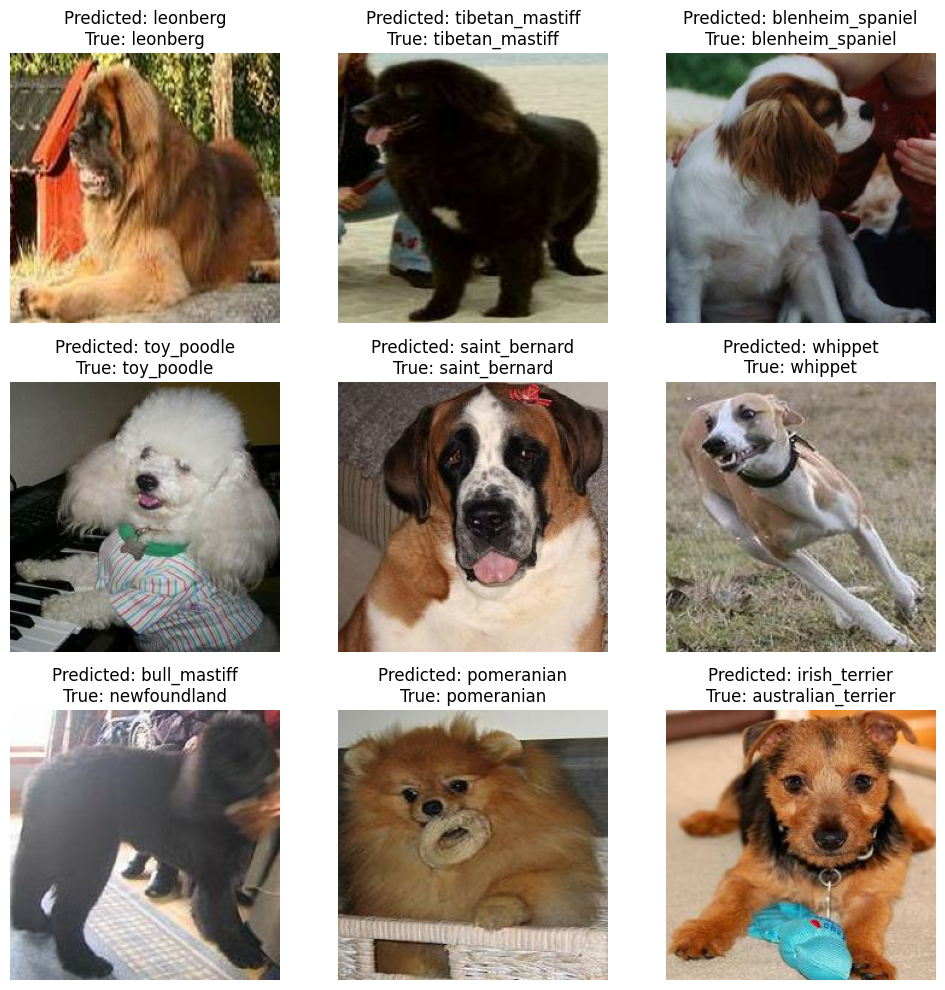

In [ ]:
plot_images_with_predictions(x_test, y_test, label_maps, model, num_images_to_plot=9)

We can see there is wrong prediction of standard_poodle and miniature_poodle. Let's check what are the most common confusations of the model.

In [ ]:
y_test_labels

array([ 69, 108,  13, ...,  81,  20,  50])

In [ ]:
predicted_labels

array([ 69, 108,  13, ...,  81,  20,  50])

#### Confusion Matrix

Confusion Matrix:
[[ 8  0  0 ...  0  0  0]
 [ 0 21  0 ...  0  0  0]
 [ 0  0 13 ...  0  0  0]
 ...
 [ 0  0  0 ... 12  0  0]
 [ 0  0  0 ...  0  7  0]
 [ 0  0  0 ...  0  0  9]]


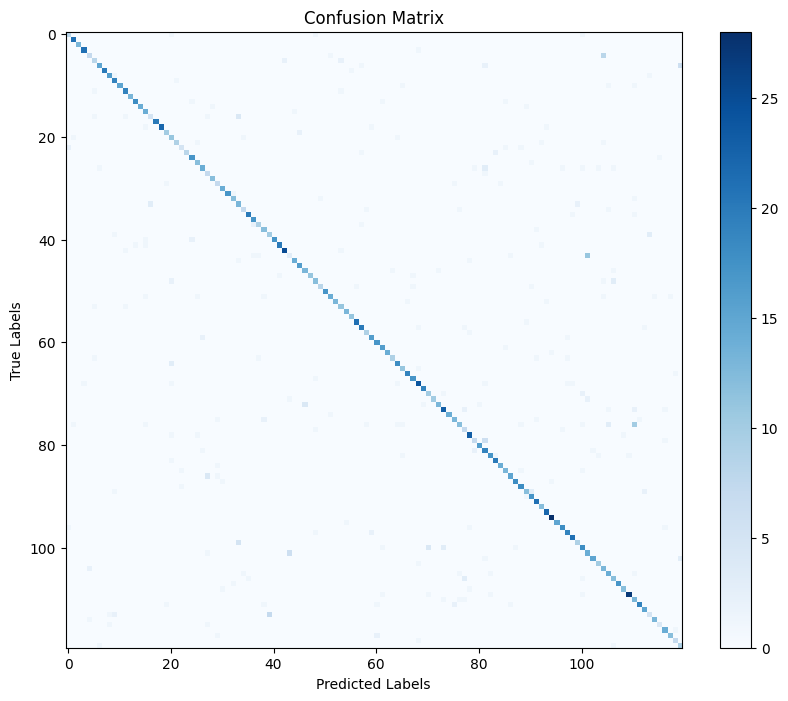

In [ ]:

# Calculate confusion matrix
conf_matrix = confusion_matrix(y_test_labels, predicted_labels)

# Print confusion matrix
print("Confusion Matrix:")
print(conf_matrix)

# Plot confusion matrix as an image
plt.figure(figsize=(10, 8))
plt.imshow(conf_matrix, cmap='Blues', interpolation='nearest')
plt.title('Confusion Matrix')
plt.colorbar()
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()




The diagonal in the graph emphasizes that our model correctly identifies most of the breeds, but there are still some confusions represented as small squares outside the diagonal.

#### Most common incorrect predictions

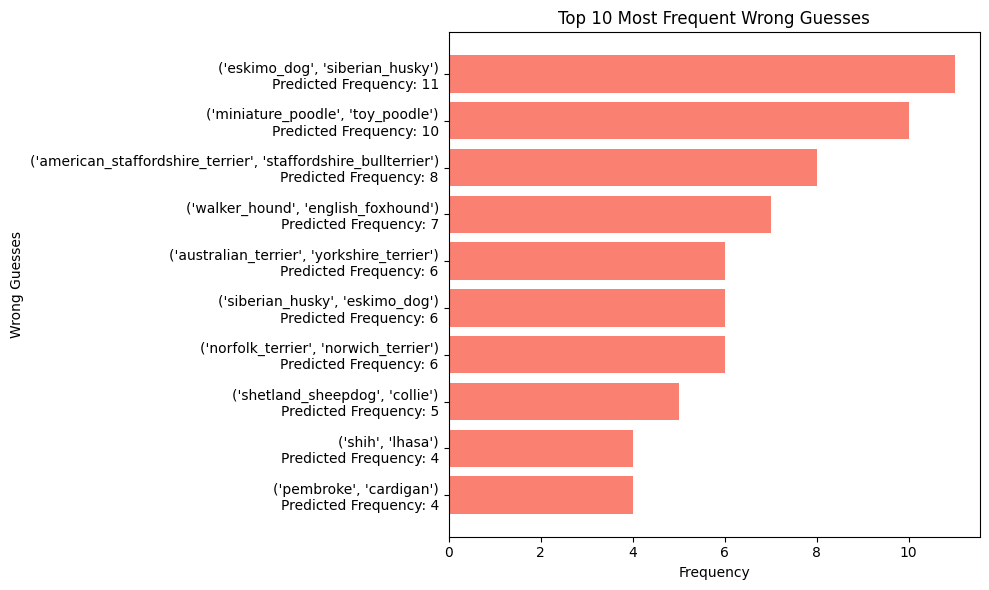

In [ ]:

# Find indices where predictions are incorrect
incorrect_indices = [i for i in range(len(y_test_labels)) if y_test_labels[i] != predicted_labels[i]]

# Get the true and predicted labels for the incorrect predictions
incorrect_true_labels = [get_key_from_value(label_maps, y_test_labels[i]) for i in incorrect_indices]
incorrect_pred_labels = [get_key_from_value(label_maps, predicted_labels[i]) for i in incorrect_indices]

# Combine true and predicted labels to create pairs
incorrect_guesses = list(zip(incorrect_true_labels, incorrect_pred_labels))

# Count the occurrences of each incorrect guess
incorrect_guess_counts = Counter(incorrect_guesses)

# Get the top N most frequent wrong guesses
top_n_wrong_guesses = incorrect_guess_counts.most_common(10)

# Separate true and predicted labels for plotting
true_labels, pred_labels = zip(*[guess for guess, count in top_n_wrong_guesses])
counts = [count for guess, count in top_n_wrong_guesses]

# Plot bar chart
plt.figure(figsize=(10, 6))
plt.barh(range(len(top_n_wrong_guesses)), counts, color='salmon')
plt.yticks(range(len(top_n_wrong_guesses)), [f'{true}\nPredicted Frequency: {pred}' for true, pred in top_n_wrong_guesses])
plt.xlabel('Frequency')
plt.ylabel('Wrong Guesses')
plt.title('Top 10 Most Frequent Wrong Guesses')  # Change title accordingly
plt.gca().invert_yaxis()  # Invert y-axis to display most frequent at the top
plt.tight_layout()
plt.show()


In [ ]:
y_train_labels = np.argmax(y_train_encoded, axis=1)

Let's see if these incorrect guesses were justified and if the dogs are indeed similar

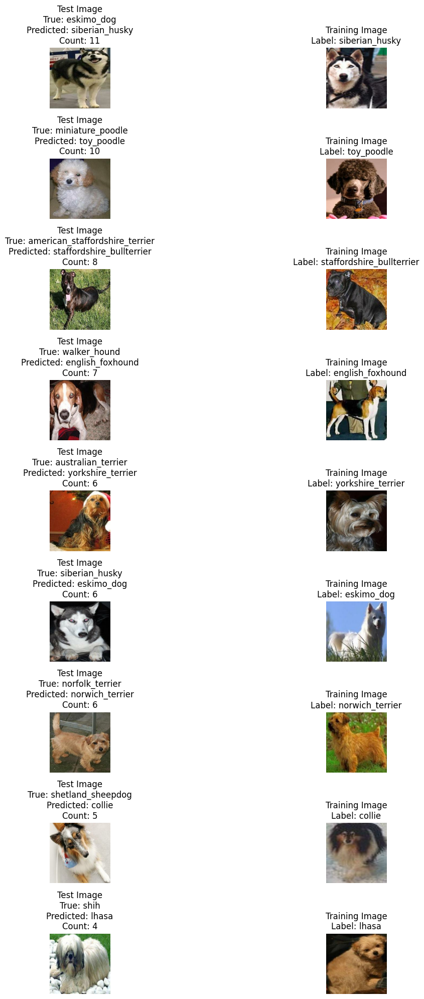

In [ ]:

def plot_images_of_wrong_guesses(x_train, y_train, x_test, y_true, y_pred, label_map, num_images_to_plot=9, figsize=(15, 20)):
    """
    Plots images of the most frequent wrong guesses along with an example image from the training dataset
    that corresponds to the predicted label.
    """
    # Find indices of wrong predictions
    wrong_indices = [i for i in range(len(y_true)) if y_true[i] != y_pred[i]]

    # Count the occurrences of each wrong guess
    wrong_guess_counts = Counter((label_map[y_true[i]], label_map[y_pred[i]]) for i in wrong_indices)

    # Sort the wrong guesses by count in descending order
    top_wrong_guesses = wrong_guess_counts.most_common(num_images_to_plot)

    # Load and plot images of top wrong guesses
    plt.figure(figsize=figsize)
    for i, (pair, count) in enumerate(top_wrong_guesses, 1):
        # Extract true and predicted labels from the pair
        true_label, pred_label = pair

        # Find index of the first occurrence of the wrong guess
        index = next((index for index in wrong_indices if label_map[y_true[index]] == true_label and label_map[y_pred[index]] == pred_label), None)

        if index is not None:
            # Read and plot the test image
            test_image = tf.io.read_file(x_test[index])
            test_image = tf.image.decode_jpeg(test_image, channels=3)
            plt.subplot(num_images_to_plot, 2, 2*i-1)
            plt.imshow(test_image)
            plt.title(f"Test Image\nTrue: {true_label}\nPredicted: {pred_label}\nCount: {count}")
            plt.axis("off")

            # Find an image from the training dataset with the predicted label
            train_index = next((idx for idx, label in enumerate(y_train) if label_map[label] == pred_label), None)

            if train_index is not None:
                # Read and plot the corresponding training image
                train_image = tf.io.read_file(x_train[train_index])
                train_image = tf.image.decode_jpeg(train_image, channels=3)
                plt.subplot(num_images_to_plot, 2, 2*i)
                plt.imshow(train_image)
                plt.title(f"Training Image\nLabel: {label_map[y_train[train_index]]}")
                plt.axis("off")
                plt.gca().set_aspect(train_image.shape[1] / train_image.shape[0])

    plt.tight_layout()
    plt.show()

plot_images_of_wrong_guesses(x_train, y_train_labels, x_test, y_test_labels, predicted_labels, label_maps_rev, figsize=(15, 20))


### To summarize:


Our project effectively classified dog breeds with high accuracy using sophisticated neural network models. Although there were a few misclassifications, the overall performance was robust, highlighting the efficacy of deep learning in image classification. We thoroughly enjoyed researching the data and experimenting with various models, which provided valuable insights into the capabilities of different approaches.